# Unpacking SQLite File
Based on [this tutorial](https://python.plainenglish.io/exploring-openstreetmap-data-using-geopandas-d62b55fc40a4).

And this [google collab](https://colab.research.google.com/drive/1wJDVi6KdEawRBWcbyw_12_VRnQPEypw4#scrollTo=IwSwmrUegpqC)

In [2]:
import sqlite3
import geopandas as gpd
import pandas as pd
from shapely import wkt


In [3]:
# connect to tiles
DATA = "../data/europe/great-britain/england/greater-london/greater-london-latest.sqlite"
con = sqlite3.connect(DATA)
cursor = con.cursor()
# inspect the result
query = """ SELECT name FROM sqlite_master WHERE type ='table' AND name NOT LIKE 'sqlite_%'; """
tables = cursor.execute(query)
tables.fetchall()

[('geometry_columns',),
 ('spatial_ref_sys',),
 ('points',),
 ('lines',),
 ('multilinestrings',),
 ('multipolygons',),
 ('other_relations',)]

In [4]:
geometry_columns = pd.read_sql("SELECT * FROM geometry_columns;", con) 
geometry_columns


,f_table_name,f_geometry_column,geometry_type,coord_dimension,srid,geometry_format
0,points,WKT_GEOMETRY,1,2,4326,WKT
1,lines,WKT_GEOMETRY,2,2,4326,WKT
2,multilinestrings,WKT_GEOMETRY,5,2,4326,WKT
3,multipolygons,WKT_GEOMETRY,6,2,4326,WKT
4,other_relations,WKT_GEOMETRY,7,2,4326,WKT


In [5]:
spatial_ref_sys = pd.read_sql("SELECT * FROM spatial_ref_sys;", con) 
spatial_ref_sys


,srid,auth_name,auth_srid,srtext
0,4326,EPSG,4326,"GEOGCS[""WGS 84"",DATUM[""WGS_1984"",SPHEROID[""WGS..."


In [6]:
# get all geometries into one dataframe 
complete_df = pd.DataFrame() 

for geom_type in ['lines', 'points', 'multilinestrings', 'multipolygons', 'other_relations']: 
    df = pd.read_sql(f"SELECT *, '{geom_type}' AS table_name FROM {geom_type};", con) 
    complete_df = pd.concat([complete_df, df], ignore_index=True)


In [7]:
complete_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2486981 entries, 0 to 2486980
Data columns (total 36 columns):
 #   Column        Dtype  
---  ------        -----  
 0   ogc_fid       int64  
 1   WKT_GEOMETRY  object 
 2   osm_id        object 
 3   name          object 
 4   highway       object 
 5   waterway      object 
 6   aerialway     object 
 7   barrier       object 
 8   man_made      object 
 9   railway       object 
 10  z_order       float64
 11  other_tags    object 
 12  table_name    object 
 13  ref           object 
 14  address       object 
 15  is_in         object 
 16  place         object 
 17  type          object 
 18  osm_way_id    object 
 19  aeroway       object 
 20  amenity       object 
 21  admin_level   object 
 22  boundary      object 
 23  building      object 
 24  craft         object 
 25  geological    object 
 26  historic      object 
 27  land_area     object 
 28  landuse       object 
 29  leisure       object 
 30  military      obje

In [8]:
# convert dataframe into geodataframe 
complete_df['geom'] = gpd.GeoSeries.from_wkt(complete_df['WKT_GEOMETRY']) 
gdf = gpd.GeoDataFrame(complete_df, geometry='geom') 
gdf.info()


<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2486981 entries, 0 to 2486980
Data columns (total 37 columns):
 #   Column        Dtype   
---  ------        -----   
 0   ogc_fid       int64   
 1   WKT_GEOMETRY  object  
 2   osm_id        object  
 3   name          object  
 4   highway       object  
 5   waterway      object  
 6   aerialway     object  
 7   barrier       object  
 8   man_made      object  
 9   railway       object  
 10  z_order       float64 
 11  other_tags    object  
 12  table_name    object  
 13  ref           object  
 14  address       object  
 15  is_in         object  
 16  place         object  
 17  type          object  
 18  osm_way_id    object  
 19  aeroway       object  
 20  amenity       object  
 21  admin_level   object  
 22  boundary      object  
 23  building      object  
 24  craft         object  
 25  geological    object  
 26  historic      object  
 27  land_area     object  
 28  landuse       object  
 29  leisur

<Axes: >

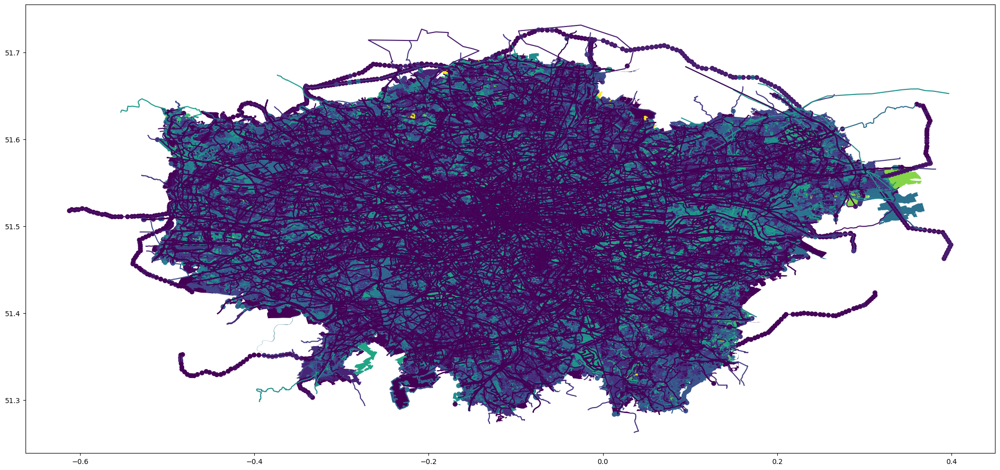

In [9]:
# Plotting all our data
gdf.plot(figsize=(25,25), column='ogc_fid')

<Axes: >

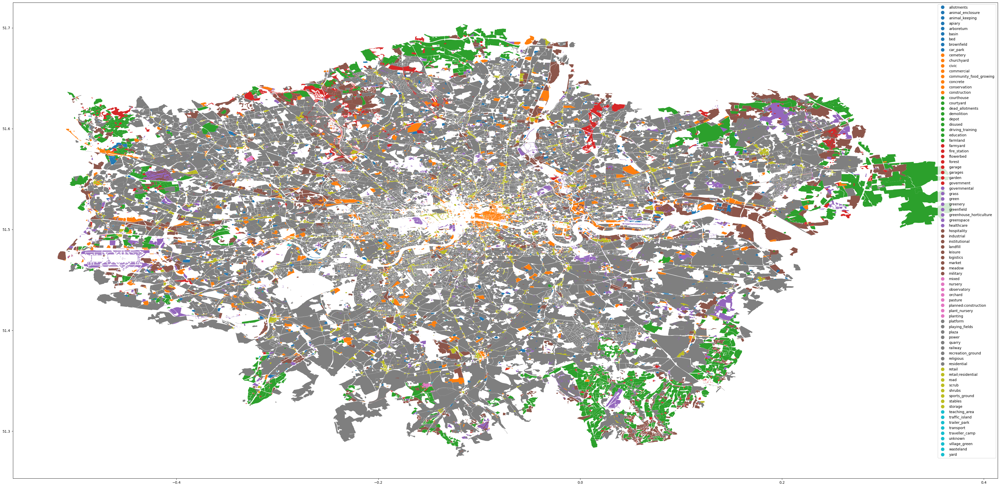

In [10]:
# viewing landuse
condition = gdf['landuse'].notnull()
gdf[condition].plot(figsize=(50,50), column="landuse", legend=True)

<Axes: >

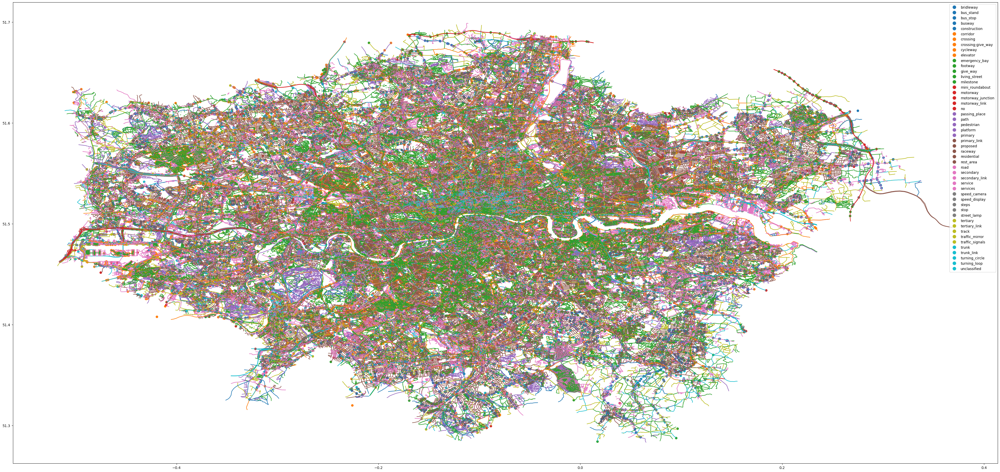

In [11]:
# viewing highways
condition = gdf['highway'].notnull()
gdf[condition].plot(figsize=(50,50), column="highway", legend=True)